<a href="https://colab.research.google.com/github/brunodasilvach/deeplearningmodul/blob/master/Prediction_of_parking_spot_availability_presentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 0 - Prediction of parking spot availability
**CAS MAIN 20.4: Deep Learning**

Bruno da Silva, Martin Buck

*14-April-2020*

---



### 0.1 About the Dataset 

* Originally from kaggle.com, containing a raspberry pi photoset of a backyard parking space

* Folders with images are labedled “full” and “free“ (1’067 * free / 2’195 * full)

* 3 GB of .jpg images

* The resolution of the images is 1’296 x 972 pixel
   
> ### Targets:

* Correct Classification whether a parking spot is free or not

* Use of various CNN

* Comparison with Machine Learning

* Try extended Approaches 
---

###0.2 Contents of this notebook

###Dataset:

> Introduction

###Approach:
> Comparisson between Machine Learning and Deep Learning
> with different sized pictures and different compiled model structures

>> Standard CNN

>> CNN with dropouts

>> CNN with batchnormalization, dropouts and no maxpooling

>> CNN with dual input of two different processed photo sets

>> Random Forest Classifier

Extended:

> Lime and Clustering


###Results:
> Comparison of the different approaches

> Accuracy and Loss Curves

> Examples of correct and wrong classification

> Clustering of parking spots

###Discussion:

> Summary

> Issues with this photoset

---


## 1 - Installation, Import and Variable Definitions

In [0]:
run_session1 = True
run_session3 = True

In [0]:
%tensorflow_version 2.x

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
## ONLY AT FIRST EXECUTION
if run_session1:
  !unzip -q "./drive/My Drive/data.zip" -d content/
  !pip install lime

     |████████████████████████████████| 276kB 1.4MB/s 
     |████████████████████████████████| 2.0MB 4.1MB/s 
  Created wheel for lime: filename=lime-0.2.0.0-cp36-none-any.whl size=284181 sha256=9c4c015573d5a8c2c2908046b3293b4746a31aa4b75ec164b9b173ac6e9b6f4b
  Stored in directory: /root/.cache/pip/wheels/22/f2/ec/e5ebd07348b2b1ac722e91c2f549fcc220f7d5f25497a61232
Successfully built lime
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [0]:
import os, sys
from math import ceil
from datetime import datetime
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

from PIL import Image, ImageOps
from tensorflow.keras.preprocessing.image import img_to_array

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Convolution2D, MaxPooling2D, Flatten , Activation, Dropout, BatchNormalization, Conv2D, concatenate
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import optimizers
from tensorflow.keras.applications import VGG16

from lime import lime_image
from skimage.segmentation import mark_boundaries

In [0]:
################## THESE VARIABLES MUST BE DEFINED  ############################
main_folder = r'/content/content/data'
os.chdir(main_folder)
sub_folders = ['Free', 'Full']
transform_modes = ['Orig_Width_50', 'Grayscale', 'Inverted_RGB', 'BnW', 'Orig_Width_150']
figsize=(7 * 3, 4.2 * 8)

## 2 - Define and call function to pre-process pictures

The images will be pre-processed in:
- A resized set with aspect ratio of 112 x 150

- A resized set with basewith 37 x 50 and based on this scale
- Grayscale, Inverted and Black & White images


which all of them are saved in a separate folder on google drive


In [0]:
###################  FUNCTION TO PROCESS PICTURES ##############################
def transform_image(image, mode):
    if mode not in transform_modes:
        print('Mode not implemented')
        return None
    if mode == 'Orig_Width_150':
        basewidth = 150
        wpercent = (basewidth / float(image.size[0]))
        hsize = int((float(image.size[1]) * float(wpercent)))
        image = image.resize((basewidth, hsize), Image.ANTIALIAS)
        return image
    
    ## For every other example, a base width of 50 will be used
    basewidth = 50
    wpercent = (basewidth / float(image.size[0]))
    hsize = int((float(image.size[1]) * float(wpercent)))
    image = image.resize((basewidth, hsize), Image.ANTIALIAS)

    if mode == 'Orig_Width_50':
      return image
    if mode == 'Grayscale':
      return image.convert('L')
    if mode == 'Inverted_RGB':
      return ImageOps.invert(image)
    if mode == 'BnW':
      threshold = 120
      return image.point(lambda p: p > threshold and 255)

In [0]:
################## CREATE DIRECTORIES ##########################################
if run_session3: # set to True if it needs to run
    for new_folder in [f'{a}/{b}' for a in transform_modes for b in sub_folders]:
        print(f'creating path {os.path.join(main_folder, new_folder)}')
        os.makedirs(new_folder, exist_ok=True)
        print('path created')

creating path /content/content/data/Orig_Width_50/Free
path created
creating path /content/content/data/Orig_Width_50/Full
path created
creating path /content/content/data/Grayscale/Free
path created
creating path /content/content/data/Grayscale/Full
path created
creating path /content/content/data/Inverted_RGB/Free
path created
creating path /content/content/data/Inverted_RGB/Full
path created
creating path /content/content/data/BnW/Free
path created
creating path /content/content/data/BnW/Full
path created
creating path /content/content/data/Orig_Width_150/Free
path created
creating path /content/content/data/Orig_Width_150/Full
path created


In [0]:
################## TRANSFORM AND SAVE PICTURES #################################
if run_session3: # set to True if it needs to run
    for sub_folder in sub_folders:
        print(f'Start all transformations with pictures in {sub_folder}')
        current_folder = os.path.join('.', sub_folder)
        files = os.listdir(current_folder)

        for file in files:
            file_path = os.path.join(current_folder, file)
            with Image.open(file_path) as im:
                for mode in transform_modes:
                    im_transf = transform_image(im, mode)
                    dest_path = os.path.join('./', mode, sub_folder)
                    im_transf.save(dest_path + f'/{mode}_' + file)
        print('done')

Start all transformations with pictures in Free
done
Start all transformations with pictures in Full
done


### 2.1 Examples of pre-processed images

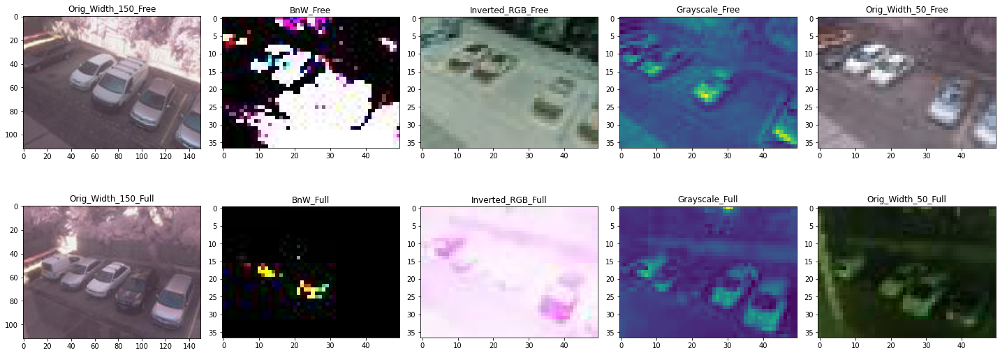

In [0]:
import IPython.display
from google.colab import files
from os import listdir
modes = transform_modes[::-1]
count = 0
plt.figure(figsize=(20,8))
for sub_folder in sub_folders:
    for mode in modes:
        count = count + 1
        dest_path = os.path.join(main_folder, mode, sub_folder)
        files = os.listdir(dest_path)
        new_dest_path = os.path.join(dest_path,files[20])
        img = Image.open(new_dest_path)

        plt.subplot(2,5,count)
        plt.title(mode + '_' + sub_folder)
        plt.imshow(img)
plt.tight_layout()     
plt.show()


## 3 - Define and call function to train all models

For each mode definded in [transform_modes] (which equals the processed image), the following models will be trained:

*   Standard CNN
*   CNN wtih dropouts
*   CNN with batchnormalization, dropouts and no maxpooling

*   CNN with dual input of two different processed photo sets

*   Random Forest (ML-Benchmark)

Each model will also be trained twice:

*   With original input (0-255)
*   With normalized input (0-1)

In [0]:
################## OUTPUT VARIABLES ############################################
summary = []
predictions = []
probabilities = []
trained_models = []
model_definitions = []
################## FUNCTION TO SIMULATE MODELS #################################
def train_ml_models(run_in_test_mode):

    cnn_modes = ['Orig_Width_50', 'Orig_Width_150']
    cnn_dual = ['Orig_Width_50', 'Inverted_RGB']
    array1_for_dual_mode = []
    array2_for_dual_mode = []
    dual_mode_done = False

    if run_in_test_mode:
        reduction_factor = 20
    else:
        reduction_factor = 1

    for mode in transform_modes:
        image_array = []
        label_array = []
        models = {}
        
        for sub_folder in sub_folders:
            print(f'Start import from pictures with label {sub_folder} into arrays for mode {mode}')
            current_folder = os.path.join(r'./', mode, sub_folder)
            files = os.listdir(current_folder)
            for file_id, file in enumerate(files):
                if file_id % reduction_factor == 0:
                    file_path = os.path.join(current_folder, file)
                    with Image.open(file_path) as im:
                        img_array = img_to_array(im, dtype=np.uint8)
                        # if im.width > 1000 and not run_in_test_mode:
                        #     reduction_factor = reduction_factor + 2 if sys.platform == 'linux' else reduction_factor + 3
                        image_array.append(img_array)
                    label_array.append([1] if sub_folder[:4] == 'Full' else [0])
            print(f'done')
        label_array = np.array(label_array)
        image_array = np.array(image_array)

        print(f'Data import for {mode} is complete')

        print(f'Split data into test, training and validation datasets')
        full_entries = label_array==1
        n_full_entries = len(image_array[full_entries.squeeze()])
        n_empty_entries = len(image_array) - n_full_entries
        # entries with label=empty
        n_empty_entries_train = int(round(n_empty_entries / 2, 0))
        n_empty_entries_validation = int(round(n_empty_entries / 4, 0))
        n_empty_entries_test = n_empty_entries - n_empty_entries_train - n_empty_entries_validation
        start = 0
        end = n_empty_entries_train
        x_train = image_array[start:end]
        y_train = label_array[start:end]
        start = end
        end = end + n_empty_entries_validation
        x_valid = image_array[start:end]
        y_valid = label_array[start:end]
        start = end
        end = end + n_empty_entries_test
        x_test = image_array[start:end]
        y_test = label_array[start:end]
        # merge with entries where label=full
        n_full_entries_train = int(round(n_full_entries / 2, 0))
        n_full_entries_validation = int(round(n_full_entries / 4, 0))
        n_full_entries_test = n_full_entries - n_full_entries_train - n_full_entries_validation
        start = n_empty_entries
        end = start + n_full_entries_train
        x_train = np.append(x_train, image_array[start:end], axis=0)
        y_train = np.append(y_train, label_array[start:end], axis=0)
        start = end
        end = end + n_full_entries_validation
        x_valid = np.append(x_valid, image_array[start:end], axis=0)
        y_valid = np.append(y_valid, label_array[start:end], axis=0)
        start = end
        end = end + n_full_entries_test
        x_test = np.append(x_test, image_array[start:end], axis=0)
        y_test = np.append(y_test, label_array[start:end], axis=0)
        # save entries for cnn dual input
        if mode == cnn_dual[0]:
          array1_for_dual_mode.append(x_train)
          array1_for_dual_mode.append(x_valid)
          array1_for_dual_mode.append(x_test)
        if mode == cnn_dual[1]:
          array2_for_dual_mode.append(x_train)
          array2_for_dual_mode.append(x_valid)
          array2_for_dual_mode.append(x_test)
        # categorize y for tensorflow
        y_train_cat = to_categorical(y_train, 2)
        y_valid_cat = to_categorical(y_valid, 2)
        y_test_cat = to_categorical(y_test, 2)
        # reshape for Random Forest
        n_dimensions = im.height * im.width * im.layers
        x_train_reshaped = np.reshape(a=x_train, newshape=(x_train.shape[0], n_dimensions))
        x_valid_reshaped = np.reshape(a=x_valid, newshape=(x_valid.shape[0], n_dimensions))
        x_test_reshaped = np.reshape(a=x_test, newshape=(x_test.shape[0], n_dimensions))
        y_train_reshaped = np.reshape(y_train, y_train.shape[0])
        print(f'done')

        if mode in cnn_modes:
          ##DEFINE NEURAL-NETWORKS
          print(f'Define Neural Networks')
          input_shape = (im.height, im.width, im.layers)
          nb_classes = 2
          
          ######### STANDARD CNN
          batch_size = 64
          kernel_size = (3, 3)
          pool_size = (2, 2)

          model = Sequential()
          model.add(Convolution2D(8, kernel_size, padding='same', input_shape=input_shape))
          model.add(Activation('relu'))
          model.add(Convolution2D(8, kernel_size, padding='same'))
          model.add(Activation('relu'))
          model.add(MaxPooling2D(pool_size=pool_size))
          
          model.add(Convolution2D(16, kernel_size, padding='same'))
          model.add(Activation('relu'))
          model.add(Convolution2D(16, kernel_size, padding='same'))
          model.add(Activation('relu'))
          model.add(MaxPooling2D(pool_size=pool_size))
          model.add(Flatten())
          
          model.add(Dense(500))
          model.add(Activation('relu'))
          model.add(Dense(300))
          model.add(Activation('relu'))
          model.add(Dense(100))
          model.add(Activation('relu'))
          model.add(Dense(20))
          model.add(Activation('relu'))
          
          model.add(Dense(nb_classes))
          model.add(Activation('softmax'))

          models['CNN Standard'] = model

          ######### CNN WITH DROPOUT
          model = Sequential()
          model.add(Convolution2D(8,kernel_size,padding='same',input_shape=input_shape))
          model.add(Activation('relu'))
          model.add(Convolution2D(8, kernel_size,padding='same'))
          model.add(Activation('relu'))
          model.add(MaxPooling2D(pool_size=pool_size))

          model.add(Convolution2D(16, kernel_size,padding='same'))
          model.add(Activation('relu'))
          model.add(Convolution2D(16,kernel_size,padding='same'))
          model.add(Activation('relu'))
          model.add(MaxPooling2D(pool_size=pool_size))

          model.add(Flatten())

          model.add(Dropout(0.3))
          model.add(Dense(500))
          model.add(Activation('relu'))
          model.add(Dropout(0.3))
          model.add(Dense(300))
          model.add(Activation('relu'))
          model.add(Dropout(0.3))
          model.add(Dense(100))
          model.add(Activation('relu'))
          model.add(Dropout(0.3))
          model.add(Dense(20))
          model.add(Activation('relu'))

          model.add(Dense(nb_classes))
          model.add(Activation('softmax'))
          
          models['CNN dropout'] = model

          ######### CNN WITH DROPOUT, NORMALIZATION AND NO MAXPOOLING
          model = Sequential()

          model.add(Convolution2D(8,kernel_size = kernel_size, input_shape=input_shape))
          model.add(Activation('relu'))
          model.add(BatchNormalization())
          model.add(Convolution2D(8, kernel_size = kernel_size))
          model.add(Activation('relu'))
          model.add(BatchNormalization())
          model.add(Convolution2D(8,kernel_size=5,strides=2,padding='same'))
          model.add(Activation('relu'))
          model.add(BatchNormalization())
          model.add(Dropout(0.3))
          
          model.add(Convolution2D(16, kernel_size = kernel_size))
          model.add(Activation('relu'))
          model.add(BatchNormalization())
          model.add(Convolution2D(16, kernel_size = kernel_size))
          model.add(Activation('relu'))
          model.add(BatchNormalization())
          model.add(Convolution2D(16,kernel_size=5,strides=2,padding='same'))
          model.add(Activation('relu'))
          model.add(BatchNormalization())
          model.add(Dropout(0.3))

          model.add(Conv2D(32, kernel_size = 4, padding='same'))
          model.add(Activation('relu'))
          model.add(BatchNormalization())

          model.add(Flatten())
          model.add(Dense(500))
          model.add(Activation('relu'))
          model.add(Dense(300))
          model.add(Activation('relu'))
          model.add(Dense(100))
          model.add(Activation('relu'))
          model.add(Dense(20))
          model.add(Activation('relu'))
          model.add(BatchNormalization())
          model.add(Dropout(0.3))
          model.add(Dense(nb_classes, activation='softmax'))
          
          models['CNN dropout and batchnorm'] = model
          print('done')          

        # Range between (0, 1) to train normalized and not normalized pictures 
        for i in range(2):
          normalize_pictures = i

          if normalize_pictures:
            x_train = (x_train / 255)
            x_valid = (x_valid / 255)
            x_test = (x_test / 255)

          results = []
          durations = []

          if array1_for_dual_mode and array2_for_dual_mode and not dual_mode_done:
            ######### DUAL INPUT
            def create_convolution_layers(model_input):
              model = Conv2D(32, (3, 3), padding='same', input_shape=input_shape)(model_input)
              model = Activation('relu')(model)
              model = MaxPooling2D((2, 2),padding='same')(model)
              model = Conv2D(64, (3, 3), padding='same')(model)
              model = Activation('relu')(model)
              model = MaxPooling2D(pool_size=(2, 2),padding='same')(model)

              model = Conv2D(128, (3, 3), padding='same')(model)
              model = Activation('relu')(model)
              model = MaxPooling2D(pool_size=(2, 2),padding='same')(model)
                  
              return model

            model1_input = Input(shape=input_shape)
            model1_model = create_convolution_layers(model1_input)
              
            model2_input = Input(shape=input_shape)
            model2_model = create_convolution_layers(model2_input)

            conv = concatenate([model1_model, model2_model])
            conv = Flatten()(conv)

            dense = Dropout(0.3)
            dense = Dense(500)(conv)
            dense = Activation('relu')(dense)
            dense = Dropout(0.3)(dense)
            dense = Dense(300)(dense)
            dense = Activation('relu')(dense)
            dense = Dropout(0.3)(dense)
            dense = Dense(100)(dense)
            dense = Activation('relu')(dense)
            dense = Dropout(0.3)(dense)
            dense = Dense(20)(dense)

            output = Dense(nb_classes, activation='softmax')(dense)

            model = Model(inputs=[model1_input, model2_input], outputs=[output])

            models['CNN Dual Input'] = model

            # at second execution with normalized mode, set execution to done
            if normalize_pictures:
              array1_for_dual_mode[0] = (array1_for_dual_mode[0] / 255)
              array1_for_dual_mode[1] = (array1_for_dual_mode[1] / 255)
              array1_for_dual_mode[2] = (array1_for_dual_mode[2] / 255)
              array2_for_dual_mode[0] = (array2_for_dual_mode[0] / 255)
              array2_for_dual_mode[1] = (array2_for_dual_mode[1] / 255)
              array2_for_dual_mode[2] = (array2_for_dual_mode[2] / 255)
              dual_mode_done = True
            
          if models:

            for model_name, model_def in models.items():             
              
              print(f'Train {model_name} with {mode} pictures with ' \
                    f'normalization={normalize_pictures} and picture size = ' \
                    f'{str(im.height)} x {str(im.width)}')
              
              ### OUTPUT MODEL DEFINITION
              model_definitions.append(model_def)

              start_time = datetime.now()
              
              model_def.compile(loss='categorical_crossentropy', 
                            optimizer=optimizers.Adam(),
                            metrics=['accuracy'])
              
              if model_name == 'CNN Dual Input':
                history = model_def.fit([array1_for_dual_mode[0], array2_for_dual_mode[0]],
                                    y_train_cat,
                                    batch_size=batch_size,
                                    epochs=20,
                                    verbose=False,
                                    validation_data=([array1_for_dual_mode[1], array2_for_dual_mode[1]], y_valid_cat))
                
                finish_time = datetime.now()
                # internal results variable
                result = model_def.predict([array1_for_dual_mode[1], array2_for_dual_mode[1]])
                
              else:
                history = model_def.fit(x_train, y_train_cat,
                                    batch_size=batch_size,
                                    epochs=20,
                                    verbose=False,
                                    validation_data=(x_valid, y_valid_cat))
                
                finish_time = datetime.now()
                # internal results variable
                result = model_def.predict(x_valid)              
              
              results.append(result)  
              # measure time taken to train
              delta = finish_time - start_time
              # external variables
              durations.append(delta.seconds / 60)
              predictions.append(np.argmax(result, axis=1))
              probabilities.append(result)
              trained_models.append(history)

              print(f'done in {delta.seconds / 60} minutes')

          ##### TRAIN WITH RANDOM FOREST            
          print(f'Train Random Forest Classifier with {mode} pictures with ' \
          f'normalization={normalize_pictures} and picture size = ' \
          f'{str(im.height)} x {str(im.width)}')

          n_components = x_train_reshaped.shape[1]            
          clf = RandomForestClassifier()
          start_time = datetime.now()
          clf = clf.fit(x_train_reshaped, y_train_reshaped)

          finish_time = datetime.now()
          delta = finish_time - start_time
          # internal result variable
          results.append(clf.predict(x_valid_reshaped))
          # external variables
          durations.append(delta.seconds / 60)
          predictions.append(clf.predict(x_valid_reshaped))
          probabilities.append([])
          trained_models.append(clf)
          model_definitions.append(RandomForestClassifier())

          print(f'done in {delta.seconds / 60} minutes')

          ### SAVE SUMMARY OF ALL EXECUTIONS WITH CURRENT MODE
          for n, result in enumerate(results):
              cnn = 1 if result.shape[-1] == 2 else 0
              
              if cnn == 1:
                  result = np.argmax(result, axis=1)
                  algorithm = list(models.keys())[n]
                  params = model_definitions[n].count_params()
              else:
                  algorithm = 'Random Forest'
                  params = -1
              
              print(f'Saving summary of {algorithm} with accuracy = {accuracy_score(y_valid, result)}.')
              
              current_summary = {}
              current_summary['Is test mode'] = run_in_test_mode
              current_summary['Type of picture'] = mode
              current_summary['Picture Size'] = str(im.height) + 'x' + str(im.width)
              current_summary['Normalized'] = normalize_pictures
              current_summary['Size of training set'] = x_train_reshaped.shape[0]
              current_summary['Algorithm'] = algorithm
              current_summary['Total Parameters'] = params
              current_summary['Minutes to Train'] = durations[n]
              current_summary['Accuracy'] = accuracy_score(y_valid, result)

              conma = confusion_matrix(np.reshape(y_valid, y_valid.shape[0]), result, labels=[0, 1])
              current_summary['Correct Predicitons'] = dict([('Empty', conma[0][0]), ('Full', conma[1][1])])
              current_summary['False Predicitons'] = dict([('Empty', conma[0][1]), ('Full', conma[1][0])])

              precall = precision_recall_fscore_support(np.reshape(y_valid, y_valid.shape[0]), result, labels=[0, 1])[:2]
              current_summary['Precision'] = dict([('Empty', precall[0][0]), ('Full', precall[0][1])])
              current_summary['Recall'] = dict([('Empty', precall[1][0]), ('Full', precall[1][1])])

              summary.append(current_summary)


          print('done')
    return x_valid, x_test, np.reshape(y_valid, newshape=(y_valid.shape[0])), np.reshape(y_test, newshape=(y_test.shape[0])), array1_for_dual_mode[1:], array2_for_dual_mode[1:]

In [0]:
validation_images, test_images, validation_labels, test_labels, dual_mode_a, dual_mode_b = train_ml_models(False)

Start import from pictures with label Free into arrays for mode Orig_Width_50
done
Start import from pictures with label Full into arrays for mode Orig_Width_50
done
Data import for Orig_Width_50 is complete
Split data into test, training and validation datasets
done
Define Neural Networks
done
Train CNN Standard with Orig_Width_50 pictures with normalization=0 and picture size = 37 x 50
done in 0.8333333333333334 minutes
Train CNN dropout with Orig_Width_50 pictures with normalization=0 and picture size = 37 x 50
done in 0.85 minutes
Train CNN dropout and batchnorm with Orig_Width_50 pictures with normalization=0 and picture size = 37 x 50
done in 1.3 minutes
Train Random Forest Classifier with Orig_Width_50 pictures with normalization=0 and picture size = 37 x 50
done in 0.11666666666666667 minutes
Saving summary of CNN Standard with accuracy = 0.9681372549019608.
Saving summary of CNN dropout with accuracy = 0.9473039215686274.
Saving summary of CNN dropout and batchnorm with accura

## 4 - Training Results

In [0]:
df = pd.json_normalize(summary)
df.sort_values('Accuracy', ascending=False)

,Is test mode,Type of picture,Picture Size,Normalized,Size of training set,Algorithm,Total Parameters,Minutes to Train,Accuracy,Correct Predicitons.Empty,Correct Predicitons.Full,False Predicitons.Empty,False Predicitons.Full,Precision.Empty,Precision.Full,Recall.Empty,Recall.Full
20,False,Orig_Width_150,112x150,1,1632,CNN Standard,1051258,7.000000,0.980392,262,538,5,11,0.959707,0.990792,0.981273,0.979964
12,False,Inverted_RGB,37x50,1,1632,CNN Dual Input,1051258,2.683333,0.975490,253,543,14,6,0.976834,0.974865,0.947566,0.989071
4,False,Orig_Width_50,37x50,1,1632,CNN Standard,1051258,0.866667,0.975490,254,542,13,7,0.973180,0.976577,0.951311,0.987250
21,False,Orig_Width_150,112x150,1,1632,CNN dropout,1051258,6.950000,0.974265,257,538,10,11,0.958955,0.981752,0.962547,0.979964
16,False,Orig_Width_150,112x150,0,1632,CNN Standard,1051258,6.933333,0.973039,254,540,13,9,0.965779,0.976492,0.951311,0.983607
0,False,Orig_Width_50,37x50,0,1632,CNN Standard,1051258,0.833333,0.968137,255,535,12,14,0.947955,0.978062,0.955056,0.974499
2,False,Orig_Width_50,37x50,0,1632,CNN dropout and batchnorm,1324002,1.300000,0.966912,251,538,16,11,0.958015,0.971119,0.940075,0.979964
5,False,Orig_Width_50,37x50,1,1632,CNN dropout,1051258,0.833333,0.965686,257,531,10,18,0.934545,0.981516,0.962547,0.967213
17,False,Orig_Width_150,112x150,0,1632,CNN dropout,1051258,6.883333,0.960784,249,535,18,14,0.946768,0.967450,0.932584,0.974499
10,False,Inverted_RGB,37x50,0,1632,CNN Dual Input,1051258,2.683333,0.959559,256,527,11,22,0.920863,0.979554,0.958801,0.959927


In [0]:
print(f"Total training time: {round(df['Minutes to Train'].sum(), 2)} minutes")

Total training time: 63.67 minutes


### 4.1 Plot Accuracy and Loss from CNN Models

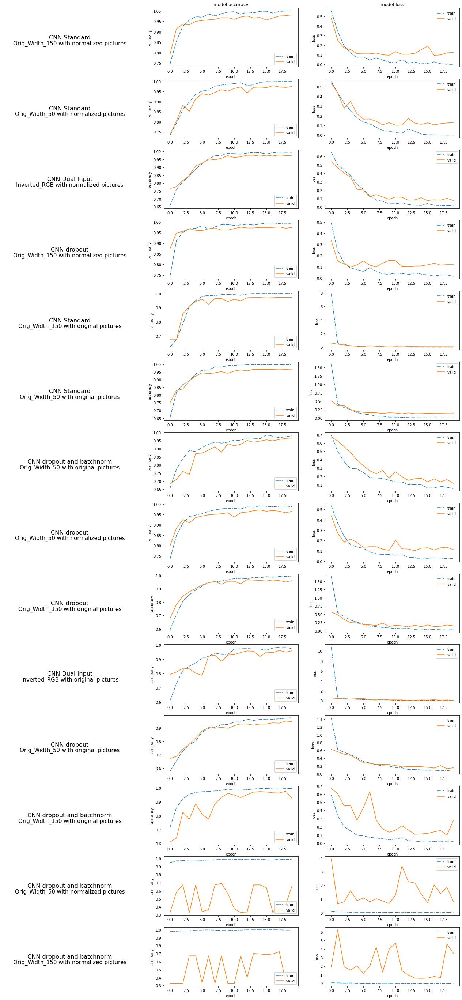

In [0]:
CNNs = list(df[df['Algorithm'].apply(lambda x: x[:3]) == 'CNN'].sort_values('Accuracy', ascending=False).index)

n_row = len(CNNs)
n_col = 3
plt.figure(figsize=(7 * 3.2, 6 * 8.2))


for n, index in enumerate(CNNs):
  i = n_col * n
  title = df.iloc[index]['Algorithm']
  normalization = df.iloc[index]['Normalized']
  mode = df.iloc[index]['Type of picture']
  
  current_history = trained_models[index].history

  ax = plt.subplot(n_row, n_col, i + 1)
  plt.grid(False)
  plt.axis('off')
  plt.xticks([])
  plt.yticks([])
  plt.text(0.5, 0.5, title, horizontalalignment='center',
          verticalalignment='center',fontsize=16, color='black'
          , transform=ax.transAxes)
  plt.text(0.5, 0.4, f'{mode} with normalized pictures' if normalization 
                        else f'{mode} with original pictures'
          , horizontalalignment='center', verticalalignment='center',fontsize=15, color='black'
          , transform=ax.transAxes)

  plt.subplot(n_row, n_col, i + 2)
  
  plt.plot(current_history['accuracy'],linestyle='-.')
  plt.plot(current_history['val_accuracy'])
  if n == 0:
    plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'valid'], loc='lower right')

  plt.subplot(n_row, n_col, i + 3)
  plt.plot(current_history['loss'],linestyle='-.')
  plt.plot(current_history['val_loss'])
  if n == 0:
    plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'valid'], loc='upper right')

## 5 - Analysis with best CNN method

### 5.1 Predicting on test data

In [0]:
best_model_index = CNNs[0]
best_model = model_definitions[best_model_index]
best_model_normalized = df.iloc[best_model_index]['Normalized']
best_model_algorithm = df.iloc[best_model_index]['Algorithm']

if not best_model_normalized:
  # since the output version was normalized, we must revert it
  test_images = test_images * 255
  dual_mode_a = [mode * 255 for mode in dual_mode_a]
  dual_mode_b = [mode * 255 for mode in dual_mode_b]

if best_model_algorithm == 'CNN Dual Input':
  pred = best_model.predict([dual_mode_a[1], dual_mode_b[1]])
else:
  pred = best_model.predict(test_images)

result = np.argmax(pred, axis=1)
valid_accuracy = df.iloc[best_model_index]['Accuracy']

print(f'Algorithm accuracy on test dataset: {accuracy_score(test_labels, result)} \n')
print(f'Confusion Matrix: \n {confusion_matrix(test_labels, result)} \n')
print(f'Accuracy on validation dataset was: {valid_accuracy}')

Algorithm accuracy on test dataset: 0.9680589680589681 

Confusion Matrix: 
 [[246  20]
 [  6 542]] 

Accuracy on validation dataset was: 0.9803921568627451


### 5.2 Plotting example images

##### 5.2.0 Function Definition

Define function to plot pictures and probabilities

In [0]:
def plot_image(img, iscorrect):
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  title = 'Correct Decision' if iscorrect else 'Incorrect Decision'
  plt.title(title, color = 'green' if iscorrect else 'red')


def plot_value_array(predictions_array, isfree):
  plt.grid(False)
  plt.title('Distribution')
  plt.xticks(range(2), ['Free', 'Full'])
  plt.ylabel('Probability')
  #plt.yticks([0, 1],['0%', '100%'])
  thisplot = plt.bar(range(2), predictions_array, color="#777777")
  plt.ylim([0, 1])

  if isfree:
    thisplot[1].set_color('orangered')
    thisplot[0].set_color('blue')
  else:
    thisplot[0].set_color('orangered')
    thisplot[1].set_color('blue')

Create Summary of each prediction with the validation data

In [0]:
prediction_best_model = predictions[best_model_index]
probabilities_best_model = probabilities[best_model_index]
y_pred_actual = pd.DataFrame(np.column_stack((prediction_best_model, validation_labels)), columns=["Predicted", "Actual"], dtype=int)

y_pred_actual['Correct Prediction.Empty'] = (y_pred_actual["Predicted"] == 0) & (y_pred_actual["Actual"] == 0)
y_pred_actual['Correct Prediction.Full'] = (y_pred_actual["Predicted"] == 1) & (y_pred_actual["Actual"] == 1)
y_pred_actual['False Prediction.Empty'] = (y_pred_actual["Predicted"] == 1) & (y_pred_actual["Actual"] == 0)
y_pred_actual['False Prediction.Full'] = (y_pred_actual["Predicted"] == 0) & (y_pred_actual["Actual"] == 1)
y_pred_actual['Probability Empty'] = probabilities_best_model[:, 0]
y_pred_actual['Probability Full'] = probabilities_best_model[:, 1]

##### 5.2.1 Correct Predictions

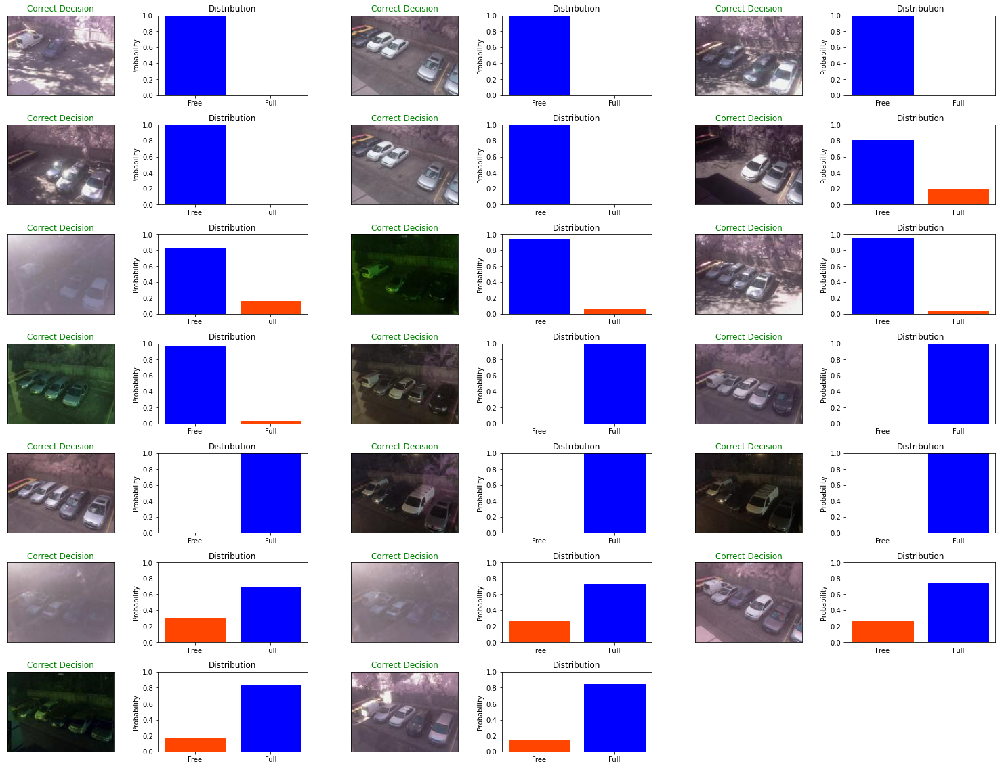

In [0]:
h, w, color_channels = validation_images[0].shape

num_rows = 15
num_cols = 3
#plt.figure(figsize=(2 * 2.5 * num_cols, 2 * num_rows))
plt.figure(figsize=figsize)

empty_correct_probs = y_pred_actual[y_pred_actual['Correct Prediction.Empty'] == 1]['Probability Empty'].sort_values().index
full_correct_probs = y_pred_actual[y_pred_actual['Correct Prediction.Full'] == 1]['Probability Full'].sort_values().index

counter = 0
for i in range(10):
  if i < 5:
    plt.subplot(num_rows, 2 * num_cols, 2 * counter + 1)
    pos = list(empty_correct_probs)[-(i+1)]
    img = validation_images[pos].reshape(h, w, color_channels)
    plot_image(img=img, iscorrect=True)
    plt.subplot(num_rows, 2 * num_cols, 2 *counter + 2)
    plot_value_array(predictions_array=y_pred_actual.iloc[pos][['Probability Empty','Probability Full']].values, isfree=True)
  else:
    plt.subplot(num_rows, 2 * num_cols, 2 * counter + 1)
    pos = list(empty_correct_probs)[(i-4)]
    img = validation_images[pos].reshape((h, w, color_channels))
    plot_image(img=img, iscorrect=True)
    plt.subplot(num_rows, 2 * num_cols, 2 *counter + 2)
    plot_value_array(predictions_array=y_pred_actual.iloc[pos][['Probability Empty','Probability Full']].values, isfree=True)
  counter += 1

for i in range(10):
  if i < 5:
    plt.subplot(num_rows, 2 * num_cols, 2 * counter + 1)
    pos = list(full_correct_probs)[-(i+1)]
    img = validation_images[pos].reshape(h, w, color_channels)
    plot_image(img=img, iscorrect=True)
    plt.subplot(num_rows, 2 * num_cols, 2 *counter + 2)
    plot_value_array(predictions_array=y_pred_actual.iloc[pos][['Probability Empty','Probability Full']].values, isfree=False)
  else:
    plt.subplot(num_rows, 2 * num_cols, 2 * counter + 1)
    pos = list(full_correct_probs)[(i-4)]
    img = validation_images[pos].reshape((h, w, color_channels))
    plot_image(img=img, iscorrect=True)
    plt.subplot(num_rows, 2 * num_cols, 2 *counter + 2)
    plot_value_array(predictions_array=y_pred_actual.iloc[pos][['Probability Empty','Probability Full']].values, isfree=False)
  counter += 1


plt.tight_layout()
plt.show()

##### 5.2.2 Wrong Predictions

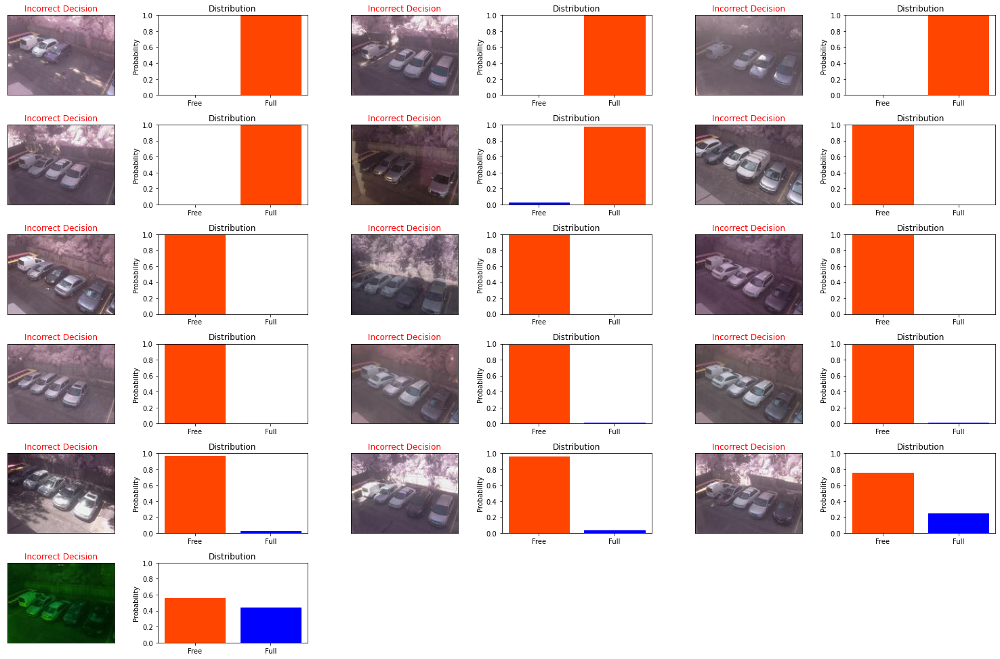

In [0]:
h, w, color_channels = validation_images[0].shape

num_rows = 15
num_cols = 3
plt.figure(figsize=figsize)
#plt.figure(figsize=(2 * 2.5 * num_cols, 2 * num_rows))


empty_incorrect_probs = y_pred_actual[pd.Index(y_pred_actual['False Prediction.Empty'] == 1)]['Probability Full'].sort_values().index
full_incorrect_probs = y_pred_actual[pd.Index(y_pred_actual['False Prediction.Full'] == 1)]['Probability Empty'].sort_values().index

counter = 0
for i in range(len(empty_incorrect_probs)):
    plt.subplot(num_rows, 2 * num_cols, 2 * counter + 1)
    pos = list(empty_incorrect_probs)[-(i+1)]
    img = validation_images[pos].reshape(h, w, color_channels)
    plot_image(img=img, iscorrect=False)
    plt.subplot(num_rows, 2 * num_cols, 2 *counter + 2)
    plot_value_array(predictions_array=y_pred_actual.iloc[pos][['Probability Empty','Probability Full']].values, isfree=True)
    counter += 1

for i in range(len(full_incorrect_probs)):
    plt.subplot(num_rows, 2 * num_cols, 2 * counter + 1)
    pos = list(full_incorrect_probs)[-(i+1)]
    img = validation_images[pos].reshape(h, w, color_channels)
    plot_image(img=img, iscorrect=False)
    plt.subplot(num_rows, 2 * num_cols, 2 *counter + 2)
    plot_value_array(predictions_array=y_pred_actual.iloc[pos][['Probability Empty','Probability Full']].values, isfree=False)
    counter += 1

plt.tight_layout()
plt.show()

## 6 - Explain Predictions with LIME library

### 6.1 Define functions to get lime explainers and to plot them

In [0]:
### FUNCTION TO IDENTIFY WHAT PIXELS ARE IMPORTANT TO A NEURAL NETWORK
def lime_pictures(picture_indexes, num_features=5, positive_only=False, hide_rest=False):
    high_score_pics = []
    low_score_pics = []

    highest_scores_index = picture_indexes[-5:]
    lowest_scores_index = picture_indexes[:5]
    prediciton = np.max(y_pred_actual.iloc[highest_scores_index]['Predicted'])
    if prediciton == 1:
        highest_scores = y_pred_actual.iloc[highest_scores_index][['Probability Full']]
        lowest_scores = y_pred_actual.iloc[lowest_scores_index][['Probability Full']]
    else:
        highest_scores = y_pred_actual.iloc[highest_scores_index][['Probability Empty']]
        lowest_scores = y_pred_actual.iloc[lowest_scores_index][['Probability Empty']]

    highest_scores_pics = validation_images[highest_scores_index]
    lowest_scores_pics = validation_images[lowest_scores_index]

    lime_explainer = lime_image.LimeImageExplainer(verbose=False)

    for pic in highest_scores_pics:
        explanation = lime_explainer.explain_instance(pic, best_model.model.predict, top_labels=2, hide_color=0, num_samples=1000)
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=positive_only, num_features=num_features, hide_rest=hide_rest)
        high_score_pics.append(mark_boundaries(temp, mask))

    for pic in lowest_scores_pics:
        explanation = lime_explainer.explain_instance(pic, best_model.model.predict, top_labels=2, hide_color=0, num_samples=1000)
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=positive_only, num_features=num_features, hide_rest=hide_rest)
        low_score_pics.append(mark_boundaries(temp, mask))

    return high_score_pics, highest_scores, low_score_pics, lowest_scores

In [0]:
def plot_limed_pictures(images, scores, title, subtitles):

## takes 10 pictures (5 with high probability and 5 with low probability)
## and plots them in 4x3 shape, with the first square being title and subtitle

  n_row = 4
  n_col = 3
  
  plt.figure(figsize=(n_col*4, n_row*3))
  h, w, color_channels = images[0][0].shape

  ## preparation and 
  dummy_img = np.zeros(shape=(h, w, color_channels))
  high_prob_imgs = images[0]
  low_prob_imgs = images[1]

  high_prob_scores = scores[0]
  low_prob_scores = scores[1]

  if len(high_prob_imgs) < 5:
    missing_pics = 5 - len(high_prob_imgs)
    for n in range(missing_pics):
      high_prob_imgs.append(dummy_img)
    high_prob_scores = np.concatenate((high_prob_scores, np.zeros(shape=(missing_pics,1))))

  if len(low_prob_imgs) < 5:
    missing_pics = 5 - len(low_prob_imgs)
    for n in range(missing_pics):
      low_prob_imgs.append(dummy_img)
    low_prob_scores = np.concatenate((low_prob_scores, np.zeros(shape=(missing_pics, 1))))

  for n in range(6):
    i = n + 1
    if i == 1:
      ax = plt.subplot(n_row, n_col, i)
      plt.grid(False)
      plt.axis('off')
      plt.xticks([])
      plt.yticks([])
      plt.text(0.5, 0.5, title, horizontalalignment='center',
              verticalalignment='center',fontsize=16, color='black'
            , transform=ax.transAxes)
      plt.text(0.5, 0.4, subtitles[0]
            , horizontalalignment='center', verticalalignment='center',fontsize=15, color='black'
            , transform=ax.transAxes)
    else:
      plt.subplot(n_row, n_col, i)
      img = high_prob_imgs[n-1].reshape((h, w, color_channels))
      plt.imshow(img)
      score = round(float(high_prob_scores[n-1]), 2)
      text=f'score: {score}'
      plt.title(text, size=14)
      plt.xticks(())
      plt.yticks(())

  for n in range(6):
    i = n + 1 + 6
    if i == 7:
      ax = plt.subplot(n_row, n_col, i)
      plt.grid(False)
      plt.axis('off')
      plt.xticks([])
      plt.yticks([])
      plt.text(0.5, 0.5, title, horizontalalignment='center',
              verticalalignment='center',fontsize=16, color='black'
            , transform=ax.transAxes)
      plt.text(0.5, 0.4, subtitles[1]
            , horizontalalignment='center', verticalalignment='center',fontsize=15, color='black'
            , transform=ax.transAxes)
    else:
      plt.subplot(n_row, n_col, i)
      img = low_prob_imgs[n-1].reshape((h, w, color_channels))
      plt.imshow(img)
      score = round(float(low_prob_scores[n-1]), 2)
      text=f'score: {score}'
      plt.title(text, size=14)
      plt.xticks(())
      plt.yticks(())

  plt.tight_layout()
  plt.show()

### 6.2 Explain pictures from winning CNN

In [0]:
## Data Preparation
# 
best_model_index = df.iloc[CNNs][df.iloc[CNNs]['Algorithm']!='CNN Dual Input'].sort_values('Accuracy', ascending=False)['Accuracy'].idxmax()

print(f"Model for next examples: {df.iloc[best_model_index]['Algorithm']}")

best_model = trained_models[best_model_index]
prediction_best_model = predictions[best_model_index]
probabilities_best_model = probabilities[best_model_index]
y_pred_actual = pd.DataFrame(np.column_stack((prediction_best_model, validation_labels)), columns=["Predicted", "Actual"], dtype=int)

y_pred_actual['Correct Prediction.Empty'] = (y_pred_actual["Predicted"] == 0) & (y_pred_actual["Actual"] == 0)
y_pred_actual['Correct Prediction.Full'] = (y_pred_actual["Predicted"] == 1) & (y_pred_actual["Actual"] == 1)
y_pred_actual['False Prediction.Empty'] = (y_pred_actual["Predicted"] == 1) & (y_pred_actual["Actual"] == 0)
y_pred_actual['False Prediction.Full'] = (y_pred_actual["Predicted"] == 0) & (y_pred_actual["Actual"] == 1)
y_pred_actual['Probability Empty'] = probabilities_best_model[:, 0]
y_pred_actual['Probability Full'] = probabilities_best_model[:, 1]

empty_correct_probs = y_pred_actual[pd.Index(y_pred_actual['Correct Prediction.Empty'] == 1)]['Probability Empty'].sort_values().index
full_correct_probs = y_pred_actual[pd.Index(y_pred_actual['Correct Prediction.Full'] == 1)]['Probability Full'].sort_values().index
empty_incorrect_probs = y_pred_actual[pd.Index(y_pred_actual['False Prediction.Empty'] == 1)]['Probability Full'].sort_values().index
full_incorrect_probs = y_pred_actual[pd.Index(y_pred_actual['False Prediction.Full'] == 1)]['Probability Empty'].sort_values().index

Model for next examples: CNN Standard


In [0]:
y_pred_actual

,Predicted,Actual,Correct Prediction.Empty,Correct Prediction.Full,False Prediction.Empty,False Prediction.Full,Probability Empty,Probability Full
0,0,0,True,False,False,False,9.999987e-01,0.000001
1,0,0,True,False,False,False,9.999938e-01,0.000006
2,0,0,True,False,False,False,9.999483e-01,0.000052
3,0,0,True,False,False,False,9.997478e-01,0.000252
4,0,0,True,False,False,False,9.999949e-01,0.000005
...,...,...,...,...,...,...,...,...
811,1,1,False,True,False,False,1.134139e-07,1.000000
812,1,1,False,True,False,False,7.775965e-03,0.992224
813,1,1,False,True,False,False,1.729097e-09,1.000000
814,1,1,False,True,False,False,4.247102e-09,1.000000


#### 6.2.1 Correct Predictions from full pictures

In [0]:
high_score_pics, highest_scores, low_score_pics, lowest_scores = lime_pictures(picture_indexes=full_correct_probs)

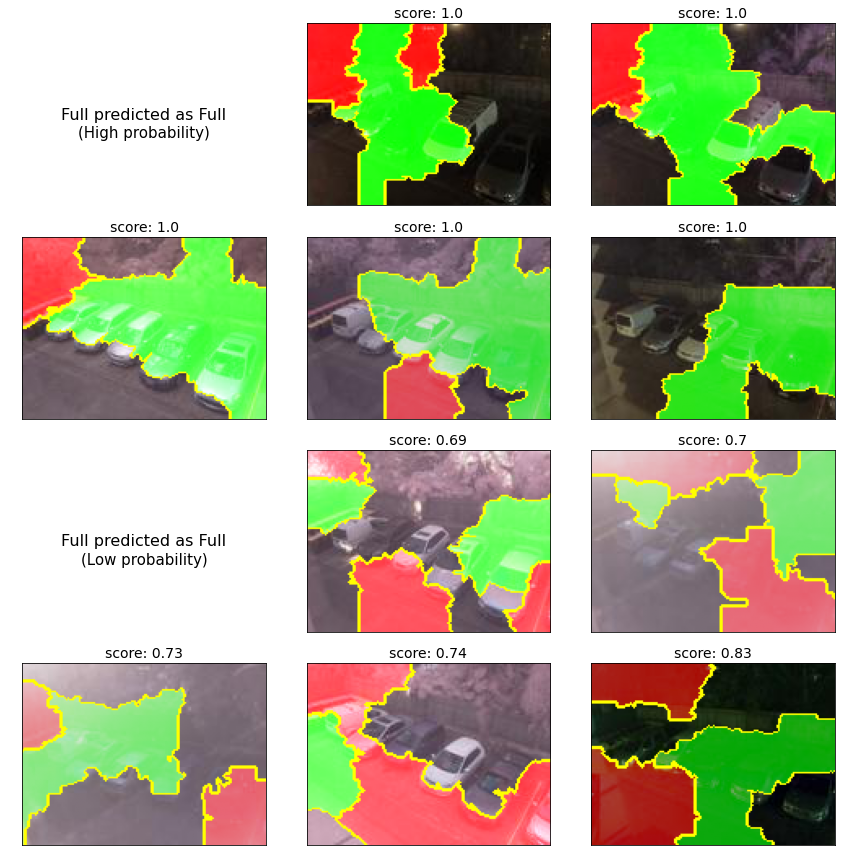

In [0]:
plot_limed_pictures(images=[high_score_pics, low_score_pics],
                    scores=[highest_scores.values, lowest_scores.values],
                    title='Full predicted as Full',
                    subtitles=['(High probability)', '(Low probability)'])

#### 6.2.2 Correct Predictions from empty pictures

In [0]:
high_score_pics, highest_scores, low_score_pics, lowest_scores = lime_pictures(picture_indexes=empty_correct_probs)

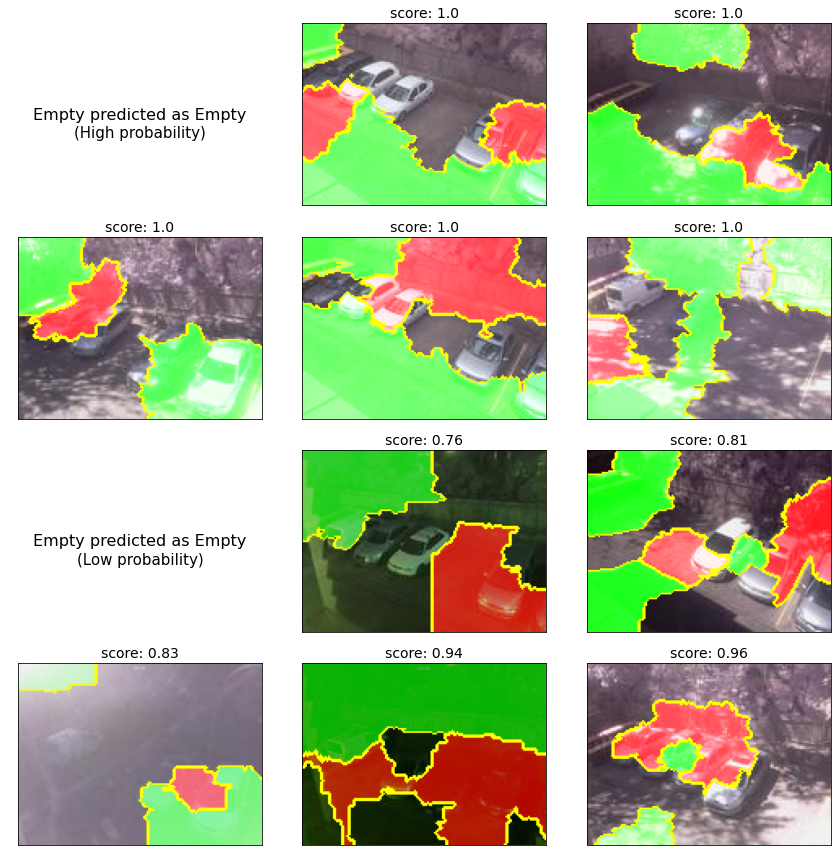

In [0]:
plot_limed_pictures(images=[high_score_pics, low_score_pics],
                    scores=[highest_scores.values, lowest_scores.values],
                    title='Empty predicted as Empty',
                    subtitles=['(High probability)', '(Low probability)'])

#### 6.2.3 Wrong Predictions from full pictures

In [0]:
high_score_pics, highest_scores, low_score_pics, lowest_scores = lime_pictures(picture_indexes=full_incorrect_probs)

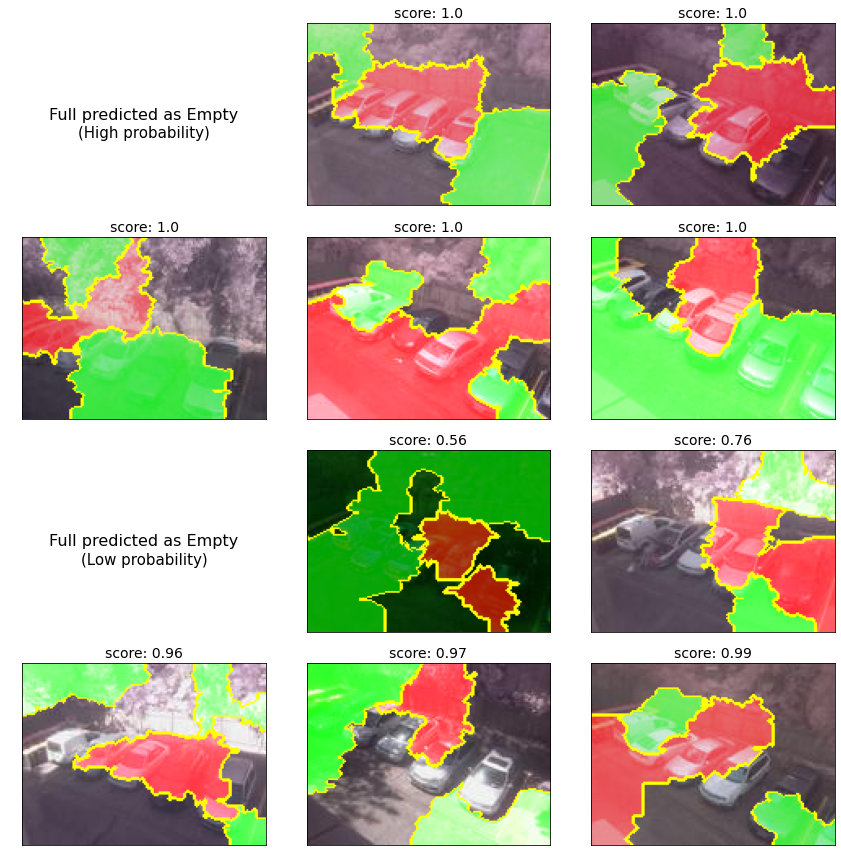

In [0]:
plot_limed_pictures(images=[high_score_pics, low_score_pics],
                    scores=[highest_scores.values, lowest_scores.values],
                    title='Full predicted as Empty',
                    subtitles=['(High probability)', '(Low probability)'])

#### 6.2.4 Wrong Predictions from empty pictures

In [0]:
high_score_pics, highest_scores, low_score_pics, lowest_scores = lime_pictures(picture_indexes=empty_incorrect_probs)

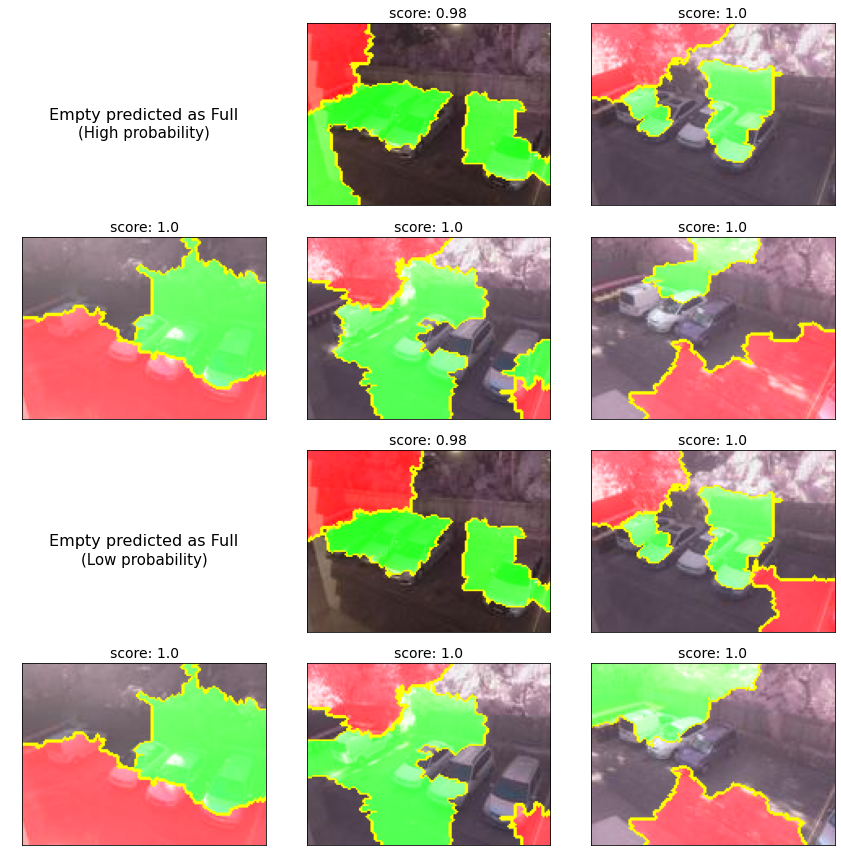

In [0]:
plot_limed_pictures(images=[high_score_pics, low_score_pics],
                    scores=[highest_scores.values, lowest_scores.values],
                    title='Empty predicted as Full',
                    subtitles=['(High probability)', '(Low probability)'])

## 7 - Can we predict exactly what spots are empty with clustering?

In [0]:
##Clustered Pictures Predicted as Empty and with probability >= 99%

high_score_empties = y_pred_actual[((y_pred_actual['Correct Prediction.Empty'] == 1) & (y_pred_actual['Probability Empty'] >= 0.999))]['Probability Empty'].index

from sklearn.cluster import KMeans
x_cluster = validation_images[high_score_empties]
x_cluster_limed = np.empty_like(x_cluster)

lime_explainer = lime_image.LimeImageExplainer()

for n, x in enumerate(x_cluster):
    explanation = lime_explainer.explain_instance(x, best_model.model.predict, top_labels=2, hide_color=0,
                                                      num_samples=1000)
    #temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, hide_rest=True)
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, hide_rest=True)
    x_cluster_limed[n] = mark_boundaries(temp, mask)

x_cluster_limed_modified = np.reshape(x_cluster_limed, newshape=(x_cluster.shape[0], -1))
x_cluster_limed_modified.shape
x_cluster_limed_modified = np.divide(x_cluster_limed_modified, 255.)

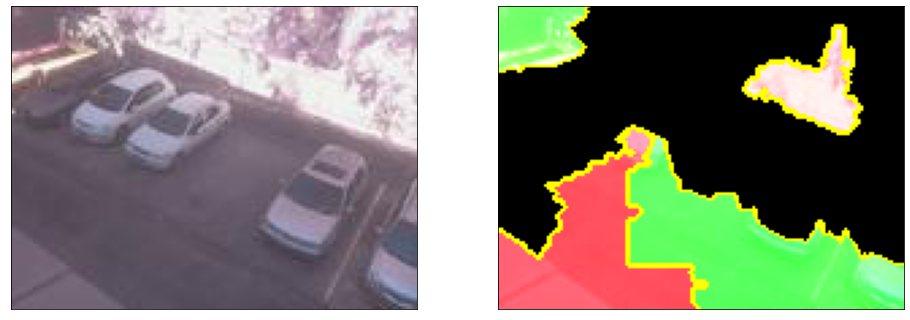

In [0]:
plt.figure(figsize=(16, 20))
plt.subplot(1, 2, 1)
plt.imshow(x_cluster[-1,:])
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.subplot(1, 2, 2)
plt.imshow(mark_boundaries(temp, mask))
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.show()

In [0]:
n_cluster = 2 ** 5 - 1
kmeans = KMeans(n_clusters=n_cluster, n_init=5, n_jobs=4)
kmeans = kmeans.fit_predict(x_cluster_limed_modified)

kmeans

if 'Cluster' in y_pred_actual.keys():
  y_pred_actual = y_pred_actual.join(pd.DataFrame(kmeans, index=high_score_empties, columns=['Cluster'], dtype=int), how='left', rsuffix='_')
  y_pred_actual['Cluster'] = y_pred_actual['Cluster_']
  y_pred_actual.drop(columns=['Cluster_'], inplace=True)
else:
  y_pred_actual = y_pred_actual.join(pd.DataFrame(kmeans, index=high_score_empties, columns=['Cluster'], dtype=int), how='left')

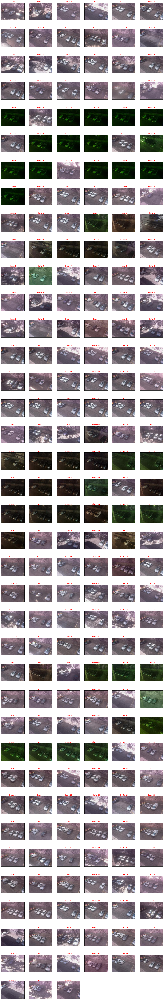

In [0]:
clustered_images = y_pred_actual[y_pred_actual['Cluster'].notnull()].sort_values('Cluster')['Cluster']

n_images = len(clustered_images)
n_clusters = y_pred_actual['Cluster'].nunique()
n_plots = n_images + n_clusters
n_rows = ceil(n_plots / 6)
h, w, color_channels = validation_images[0].shape

plt.figure(figsize=(6 * 4, n_rows * 4))

i = 1
for index, cluster in clustered_images.items():
    plt.subplot(n_rows, 6, i)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    img = validation_images[index].reshape(h, w, color_channels)
    plt.imshow(img)
    plt.title(f'Cluster {ceil(cluster)}', color = 'red')
    i+=1

plt.show()

#8 - Discussion

## Summary
* The Standard CNN trained with **larger sized images** was the most accurate  in this project. Followed by two more advanced CNNs which are trained with smaller sized pictures. All of them were trained with normalized pictures

* Machine Learning compared to deep learning led to good results with much shorter training time

* Clustering of the parking spots worked not perfectly but still better than expected


## Issues

Because of the usage of real live images, environmental influences were present:

* The cameras position and angle were not always the same (a 6th car, which is not used for the classification, can sometimes be seen and sometimes not)

* Reflections fog or rain drops in the window

* Labelling was not always consistent (wrong labelling was found)

> All of those issues could yield in an incorrect learning and therefore lead to wrong classifications.

## Ideas for next Steps
* Crop the pictures to the dimension of the parking space

* Classification in day and night cycles

* Train the winning model with even larger pictures

* Fix wrong labels

